## Importing necessary libraries

In [ ]:
import pandas as pd
import numpy as np


import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTE

from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV

from xgboost import XGBClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier


from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score

from sklearn.preprocessing import OneHotEncoder

## Loading dataset

In [2]:
df = pd.read_csv('crop recommendation.csv')
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
df

,Place,pH,pH (Cls),EC,EC (Cls),OC,OC (Cls),N,N (Cls),P,P (Cls),K,K( Cls),S,S (Cls),Zn,Zn (Cls),Fe,Fe (Cls),Cu,Cu( Cls),Mn,Mn (Cls),B,B( C ls),Suitable crop
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,coonoor,5.200,HAc,0.360,N,1.170,VH,7.000,VL,33.000,M,320.000,M,13.000,S,0.630,S,15.180,S,0.980,S,6.120,S,12.000,S,potato
2,coonoor,4.800,HAc,0.330,N,1.030,VH,NaN,NaN,16.000,L,138.000,L,7.500,D,2.040,S,27.380,S,1.860,S,18.370,S,2.000,S,potato
3,coonoor,5.100,HAc,0.460,N,0.450,L,113.400,VL,33.000,M,310.000,M,13.000,S,0.650,S,15.800,S,1.100,S,7.260,S,12.000,S,potato
4,coonoor,5.400,HAc,0.540,N,0.690,M,92.400,VL,52.000,M,260.000,M,13.000,S,0.960,S,16.200,S,1.220,S,7.240,S,12.000,S,potato
5,coonoor,5.200,HAc,0.520,N,0.900,H,75.600,VL,65.000,H,300.000,M,13.000,S,0.820,S,16.920,S,0.820,S,6.600,S,12.000,S,potato
6,coonoor,5.400,HAc,0.520,N,0.900,H,128.800,VL,33.000,M,310.000,M,13.000,S,0.980,S,16.900,S,1.320,S,6.300,S,12.000,S,potato
7,coonoor,4.900,HAc,0.480,N,0.600,M,70.000,VL,22.000,L,270.000,M,0.500,D,0.910,S,15.820,S,1.240,S,6.820,S,0.500,D,potato
8,coonoor,5.200,HAc,0.640,N,0.990,H,84.000,VL,44.000,M,270.000,M,13.000,S,0.860,S,15.820,S,0.980,S,7.260,S,12.000,S,potato
9,coonoor,5.000,HAc,0.460,N,1.500,VH,120.400,VL,44.000,M,300.000,M,13.000,S,0.760,S,16.940,S,1.260,S,6.600,S,12.000,S,potato


* First row is empty. Droping the first row using pandas drop method

In [3]:
df = df.drop([0])
df

,Place,pH,pH (Cls),EC,EC (Cls),OC,OC (Cls),N,N (Cls),P,P (Cls),K,K( Cls),S,S (Cls),Zn,Zn (Cls),Fe,Fe (Cls),Cu,Cu( Cls),Mn,Mn (Cls),B,B( C ls),Suitable crop
1,coonoor,5.200,HAc,0.360,N,1.170,VH,7.000,VL,33.000,M,320.000,M,13.000,S,0.630,S,15.180,S,0.980,S,6.120,S,12.000,S,potato
2,coonoor,4.800,HAc,0.330,N,1.030,VH,NaN,NaN,16.000,L,138.000,L,7.500,D,2.040,S,27.380,S,1.860,S,18.370,S,2.000,S,potato
3,coonoor,5.100,HAc,0.460,N,0.450,L,113.400,VL,33.000,M,310.000,M,13.000,S,0.650,S,15.800,S,1.100,S,7.260,S,12.000,S,potato
4,coonoor,5.400,HAc,0.540,N,0.690,M,92.400,VL,52.000,M,260.000,M,13.000,S,0.960,S,16.200,S,1.220,S,7.240,S,12.000,S,potato
5,coonoor,5.200,HAc,0.520,N,0.900,H,75.600,VL,65.000,H,300.000,M,13.000,S,0.820,S,16.920,S,0.820,S,6.600,S,12.000,S,potato
6,coonoor,5.400,HAc,0.520,N,0.900,H,128.800,VL,33.000,M,310.000,M,13.000,S,0.980,S,16.900,S,1.320,S,6.300,S,12.000,S,potato
7,coonoor,4.900,HAc,0.480,N,0.600,M,70.000,VL,22.000,L,270.000,M,0.500,D,0.910,S,15.820,S,1.240,S,6.820,S,0.500,D,potato
8,coonoor,5.200,HAc,0.640,N,0.990,H,84.000,VL,44.000,M,270.000,M,13.000,S,0.860,S,15.820,S,0.980,S,7.260,S,12.000,S,potato
9,coonoor,5.000,HAc,0.460,N,1.500,VH,120.400,VL,44.000,M,300.000,M,13.000,S,0.760,S,16.940,S,1.260,S,6.600,S,12.000,S,potato
10,coonoor,5.000,HAc,0.520,N,1.500,VH,120.400,VL,44.000,M,300.000,M,13.000,S,0.760,S,16.940,S,1.260,S,6.600,S,12.000,S,potato


In [4]:
df[df['Suitable crop']=='potato'].count()

Place            838
pH               838
pH (Cls)         838
EC               838
EC (Cls)         838
OC               834
OC (Cls)         834
N                824
N (Cls)          824
P                827
P (Cls)          827
K                826
K( Cls)          826
S                826
S (Cls)          826
Zn               824
Zn (Cls)         824
Fe               824
Fe (Cls)         824
Cu               820
Cu( Cls)         820
Mn               802
Mn (Cls)         802
B                824
B( C ls)         824
Suitable crop    838
dtype: int64

In [5]:
df[df['Suitable crop']=='carrot'].count()

Place            420
pH               420
pH (Cls)         420
EC               420
EC (Cls)         420
OC               418
OC (Cls)         418
N                413
N (Cls)          413
P                420
P (Cls)          420
K                420
K( Cls)          420
S                420
S (Cls)          420
Zn               420
Zn (Cls)         420
Fe               420
Fe (Cls)         420
Cu               419
Cu( Cls)         419
Mn               410
Mn (Cls)         410
B                420
B( C ls)         420
Suitable crop    420
dtype: int64

In [6]:
df[df['Suitable crop']=='cabbage'].count()

Place            134
pH               134
pH (Cls)         134
EC               134
EC (Cls)         134
OC               133
OC (Cls)         133
N                127
N (Cls)          127
P                132
P (Cls)          132
K                132
K( Cls)          132
S                131
S (Cls)          131
Zn               130
Zn (Cls)         130
Fe               130
Fe (Cls)         130
Cu               130
Cu( Cls)         130
Mn               124
Mn (Cls)         124
B                130
B( C ls)         130
Suitable crop    134
dtype: int64

In [7]:
df[df['Suitable crop']=='beetroot'].count()

Place            330
pH               330
pH (Cls)         330
EC               330
EC (Cls)         330
OC               328
OC (Cls)         328
N                319
N (Cls)          319
P                327
P (Cls)          327
K                327
K( Cls)          327
S                326
S (Cls)          326
Zn               325
Zn (Cls)         325
Fe               325
Fe (Cls)         325
Cu               323
Cu( Cls)         323
Mn               318
Mn (Cls)         318
B                325
B( C ls)         325
Suitable crop    330
dtype: int64

* dropping duplicate rows

In [8]:
df = df.drop_duplicates()
df

,Place,pH,pH (Cls),EC,EC (Cls),OC,OC (Cls),N,N (Cls),P,P (Cls),K,K( Cls),S,S (Cls),Zn,Zn (Cls),Fe,Fe (Cls),Cu,Cu( Cls),Mn,Mn (Cls),B,B( C ls),Suitable crop
1,coonoor,5.200,HAc,0.360,N,1.170,VH,7.000,VL,33.000,M,320.000,M,13.000,S,0.630,S,15.180,S,0.980,S,6.120,S,12.000,S,potato
2,coonoor,4.800,HAc,0.330,N,1.030,VH,NaN,NaN,16.000,L,138.000,L,7.500,D,2.040,S,27.380,S,1.860,S,18.370,S,2.000,S,potato
3,coonoor,5.100,HAc,0.460,N,0.450,L,113.400,VL,33.000,M,310.000,M,13.000,S,0.650,S,15.800,S,1.100,S,7.260,S,12.000,S,potato
4,coonoor,5.400,HAc,0.540,N,0.690,M,92.400,VL,52.000,M,260.000,M,13.000,S,0.960,S,16.200,S,1.220,S,7.240,S,12.000,S,potato
5,coonoor,5.200,HAc,0.520,N,0.900,H,75.600,VL,65.000,H,300.000,M,13.000,S,0.820,S,16.920,S,0.820,S,6.600,S,12.000,S,potato
6,coonoor,5.400,HAc,0.520,N,0.900,H,128.800,VL,33.000,M,310.000,M,13.000,S,0.980,S,16.900,S,1.320,S,6.300,S,12.000,S,potato
7,coonoor,4.900,HAc,0.480,N,0.600,M,70.000,VL,22.000,L,270.000,M,0.500,D,0.910,S,15.820,S,1.240,S,6.820,S,0.500,D,potato
8,coonoor,5.200,HAc,0.640,N,0.990,H,84.000,VL,44.000,M,270.000,M,13.000,S,0.860,S,15.820,S,0.980,S,7.260,S,12.000,S,potato
9,coonoor,5.000,HAc,0.460,N,1.500,VH,120.400,VL,44.000,M,300.000,M,13.000,S,0.760,S,16.940,S,1.260,S,6.600,S,12.000,S,potato
10,coonoor,5.000,HAc,0.520,N,1.500,VH,120.400,VL,44.000,M,300.000,M,13.000,S,0.760,S,16.940,S,1.260,S,6.600,S,12.000,S,potato


## Splitting data into train and test dataframe 

In [9]:
df_train, df_test = train_test_split(df)

print(
    f'The training data has {df_train.shape[0]} rows and {df_train.shape[1]} columns\n')

print(
    f'The test data has {df_test.shape[0]} rows and {df_test.shape[1]} columns')

The training data has 1245 rows and 26 columns

The test data has 415 rows and 26 columns


## EDA

In [10]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1245 entries, 690 to 665
Data columns (total 26 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Place          1245 non-null   object 
 1   pH             1245 non-null   float64
 2   pH (Cls)       1245 non-null   object 
 3   EC             1245 non-null   float64
 4   EC (Cls)       1245 non-null   object 
 5   OC             1237 non-null   float64
 6   OC (Cls)       1237 non-null   object 
 7   N              1216 non-null   float64
 8   N (Cls)        1216 non-null   object 
 9   P              1234 non-null   float64
 10  P (Cls)        1234 non-null   object 
 11  K              1234 non-null   float64
 12  K( Cls)        1234 non-null   object 
 13  S              1232 non-null   float64
 14  S (Cls)        1232 non-null   object 
 15  Zn             1229 non-null   float64
 16  Zn (Cls)       1229 non-null   object 
 17  Fe             1229 non-null   float64
 18  Fe (Cls

In [11]:
categorical_features = df_train.select_dtypes(include=['object'])

numerical_features = df_train.select_dtypes(exclude=['object'])

In [12]:
for col in df_train[categorical_features.columns]:
    print(f'{col} :{df_train[col].unique()} \n')

Place :['ooty' 'coonoor' 'gudalur'] 

pH (Cls)  :[' HAc' 'MAc ' 'MAl ' 'SlAc' 'N   '] 

EC (Cls)  :['N   ' 'HTCG' 'ITC '] 

OC (Cls)  :['H ' 'VL' nan 'M ' 'L ' 'VH'] 

N (Cls)  :[nan 'VL' 'M ' 'L ' 'VH' 'H '] 

P (Cls)  :['M ' 'VH' nan 'L ' 'H ' 'VL'] 

K( Cls)  :['M ' 'H ' nan 'L ' 'VH' 'VL'] 

S (Cls)  :['S' 'D' nan] 

Zn (Cls)  :['S' 'D' nan] 

Fe (Cls)  :['S' nan 'D'] 

Cu( Cls)  :[nan 'S' 'D'] 

Mn (Cls)  :['S' 'D' nan] 

B( C ls)  :['S' 'D' nan] 

Suitable crop :['potato' 'carrot' 'beetroot' 'cabbage'] 



In [13]:
for col in df_train[numerical_features.columns]:
    print(f'{col} :{df_train[col].unique()} \n')

pH :[5.05 4.9  6.4  7.1  4.8  5.   5.4  6.5  6.   6.6  6.2  5.3  6.1  5.1
 6.8  6.3  5.2  7.5  5.32 7.4  6.7  5.37 5.34 7.   6.51 6.69 6.53 5.16
 6.46 7.3  6.68 6.74 6.9  7.2  5.17 6.63 6.45 6.81 6.23 5.03 5.36 4.93
 6.75 6.73] 

EC :[0.71  0.18  0.26  0.    0.12  0.14  0.4   0.17  0.52  0.27  0.1   0.05
 0.22  0.2   0.16  0.19  0.48  0.28  0.37  0.3   0.11  0.35  0.42  0.41
 0.08  0.09  0.13  0.44  0.06  0.15  0.34  0.04  0.07  0.03  0.29  0.21
 0.39  0.84  0.59  0.38  0.33  0.24  0.45  0.36  0.32  0.43  0.64  0.31
 0.23  0.02  0.76  0.5   0.25  0.65  0.47  0.6   0.46  0.54  0.56  0.01
 0.258 0.157 0.9   0.68  0.58  0.63  0.108 0.214 0.51  0.75  0.88  0.67
 0.62  0.87  0.57  0.8   0.49  0.016 0.89  0.66  2.9   0.151 0.107 0.019
 0.096 1.88  4.6  ] 

OC :[8.10e-01 2.10e-01 8.40e-01      nan 5.40e-01 7.10e-01 6.40e-01 9.80e-01
 5.00e-01 1.47e+00 9.50e-01 7.20e-01 4.50e-01 6.00e-01 1.08e+00 1.20e-01
 4.80e-01 9.60e-01 1.24e+00 1.50e-01 1.09e+00 2.16e+00 0.00e+00 8.70e-01
 8.30e-01 1.03e+

In [14]:
df_train.columns

Index(['Place', 'pH', 'pH (Cls) ', 'EC', 'EC (Cls) ', 'OC', 'OC (Cls) ', 'N',
       'N (Cls) ', 'P', 'P (Cls) ', 'K', 'K( Cls) ', 'S', 'S (Cls) ', 'Zn',
       'Zn (Cls) ', 'Fe', 'Fe (Cls) ', 'Cu', 'Cu( Cls) ', 'Mn', 'Mn (Cls) ',
       'B', 'B( C ls) ', 'Suitable crop'],
      dtype='object')

## 1. renaming column names

In [15]:
df_train = df_train.rename(columns={'Place': 'place', 'pH': 'ph','pH (Cls) ':'ph_cls', 'EC':'ec', 'EC (Cls) ':'ec_cls', 'OC':'oc', 'OC (Cls) ':'oc_cls', 'N':'n',
       'N (Cls) ': 'n_cls', 'P':'p', 'P (Cls) ':'p_cls', 'K':'k', 'K( Cls) ':'k_cls', 'S':'s', 'S (Cls) ':'s_cls', 'Zn':'zn',
       'Zn (Cls) ':'zn_cls', 'Fe':'fe', 'Fe (Cls) ':'fe_cls', 'Cu':'cu', 'Cu( Cls) ':'cu_cls', 'Mn':'mn', 'Mn (Cls) ':'mn_cls',
       'B':'b', 'B( C ls) ':'b_cls', 'Suitable crop':'crop'})

In [16]:
df_train

,place,ph,ph_cls,ec,ec_cls,oc,oc_cls,n,n_cls,p,p_cls,k,k_cls,s,s_cls,zn,zn_cls,fe,fe_cls,cu,cu_cls,mn,mn_cls,b,b_cls,crop
690,ooty,5.05,HAc,0.710,N,0.810,H,NaN,NaN,32.000,M,155.000,M,37.500,S,1.600,S,34.180,S,NaN,NaN,7.260,S,1.000,S,potato
728,ooty,4.90,HAc,0.180,N,0.210,VL,135.000,VL,128.000,VH,420.000,H,13.000,S,0.380,D,7.680,S,0.960,S,360.000,S,0.200,D,potato
873,coonoor,6.40,MAc,0.260,N,0.840,H,111.000,VL,38.000,M,395.000,H,5.000,D,0.840,S,11.000,S,0.220,S,0.940,D,5.000,S,carrot
1491,coonoor,7.10,MAl,0.000,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,beetroot
620,gudalur,4.80,HAc,0.120,N,0.540,M,111.000,VL,20.000,L,290.000,M,23.000,S,2.760,S,21.760,S,0.940,S,11.280,S,1.200,S,potato
402,coonoor,5.00,HAc,0.140,N,0.710,M,300.800,M,173.000,VH,228.000,M,7.500,D,0.220,D,6.040,S,0.460,S,0.840,D,0.200,D,potato
438,coonoor,5.40,HAc,0.400,N,0.640,M,74.000,VL,81.000,H,155.000,M,40.000,S,1.760,S,44.130,S,0.740,S,11.420,S,2.000,S,potato
399,coonoor,5.00,HAc,0.170,N,0.980,H,204.020,L,12.000,L,93.000,L,7.500,D,0.960,S,1.980,D,0.410,S,0.980,D,0.200,D,potato
325,coonoor,5.00,HAc,0.520,N,0.500,L,46.200,VL,161.000,VH,1235.000,VH,12.500,S,3.560,S,4.740,S,0.840,S,1.080,D,0.200,D,potato
1463,coonoor,6.50,MAc,0.270,N,1.470,VH,1579.000,VH,124.000,VH,309.000,M,7.500,D,1.770,S,0.700,D,0.200,D,0.320,D,0.200,D,beetroot


In [17]:
df_train.describe()

,ph,ec,oc,n,p,k,s,zn,fe,cu,mn,b
count,1245.000000,1245.000000,1237.000000,1216.000000,1234.000000,1234.000000,1232.000000,1229.000000,1229.000000,1224.000000,1201.000000,1229.000000
mean,5.778522,0.204598,0.827307,256.125576,98.158610,358.761114,12.632356,1.415546,17.851024,1.218184,7.835893,1.840889
std,0.735565,0.225772,2.216906,264.794476,108.630169,282.335550,21.062461,3.101376,21.026562,1.573396,28.351043,5.282062
min,4.800000,0.000000,0.000000,0.180000,0.241000,0.200000,0.150000,0.000000,0.000000,0.000000,0.000000,0.010000
25%,5.100000,0.080000,0.440000,111.000000,25.000000,160.000000,7.500000,0.520000,4.260000,0.527500,1.260000,0.200000
50%,6.000000,0.140000,0.720000,183.200000,62.000000,272.000000,7.500000,0.860000,10.960000,0.875000,3.190000,0.500000
75%,6.400000,0.270000,1.050000,273.100000,128.400000,480.000000,13.000000,1.200000,21.760000,1.202500,7.030000,0.640000
max,7.500000,4.600000,77.000000,2214.000000,1452.000000,2169.000000,394.000000,64.000000,324.000000,15.680000,510.000000,62.500000


In [18]:
categorical_features = df_train.select_dtypes(include=['object'])

numerical_features = df_train.select_dtypes(exclude=['object'])
numerical_features

,ph,ec,oc,n,p,k,s,zn,fe,cu,mn,b
690,5.05,0.710,0.810,NaN,32.000,155.000,37.500,1.600,34.180,NaN,7.260,1.000
728,4.90,0.180,0.210,135.000,128.000,420.000,13.000,0.380,7.680,0.960,360.000,0.200
873,6.40,0.260,0.840,111.000,38.000,395.000,5.000,0.840,11.000,0.220,0.940,5.000
1491,7.10,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
620,4.80,0.120,0.540,111.000,20.000,290.000,23.000,2.760,21.760,0.940,11.280,1.200
402,5.00,0.140,0.710,300.800,173.000,228.000,7.500,0.220,6.040,0.460,0.840,0.200
438,5.40,0.400,0.640,74.000,81.000,155.000,40.000,1.760,44.130,0.740,11.420,2.000
399,5.00,0.170,0.980,204.020,12.000,93.000,7.500,0.960,1.980,0.410,0.980,0.200
325,5.00,0.520,0.500,46.200,161.000,1235.000,12.500,3.560,4.740,0.840,1.080,0.200
1463,6.50,0.270,1.470,1579.000,124.000,309.000,7.500,1.770,0.700,0.200,0.320,0.200


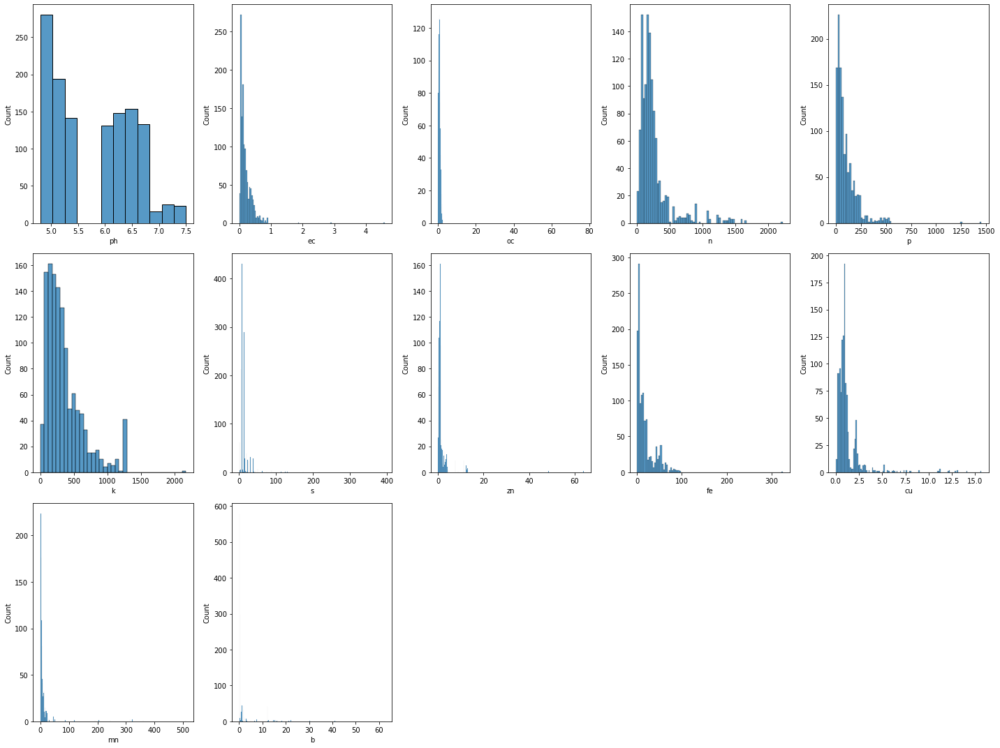

In [19]:
plt.figure(figsize=(20, 15))
plotnumber = 1

for column in numerical_features:
    if plotnumber <= 13:
        ax = plt.subplot(3, 5, plotnumber)
        sns.histplot(df_train[column])
        plt.xlabel(column)

    plotnumber += 1

plt.tight_layout()
plt.show()

In [20]:
categorical_features

,place,ph_cls,ec_cls,oc_cls,n_cls,p_cls,k_cls,s_cls,zn_cls,fe_cls,cu_cls,mn_cls,b_cls,crop
690,ooty,HAc,N,H,NaN,M,M,S,S,S,NaN,S,S,potato
728,ooty,HAc,N,VL,VL,VH,H,S,D,S,S,S,D,potato
873,coonoor,MAc,N,H,VL,M,H,D,S,S,S,D,S,carrot
1491,coonoor,MAl,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,beetroot
620,gudalur,HAc,N,M,VL,L,M,S,S,S,S,S,S,potato
402,coonoor,HAc,N,M,M,VH,M,D,D,S,S,D,D,potato
438,coonoor,HAc,N,M,VL,H,M,S,S,S,S,S,S,potato
399,coonoor,HAc,N,H,L,L,L,D,S,D,S,D,D,potato
325,coonoor,HAc,N,L,VL,VH,VH,S,S,S,S,D,D,potato
1463,coonoor,MAc,N,VH,VH,VH,M,D,S,D,D,D,D,beetroot


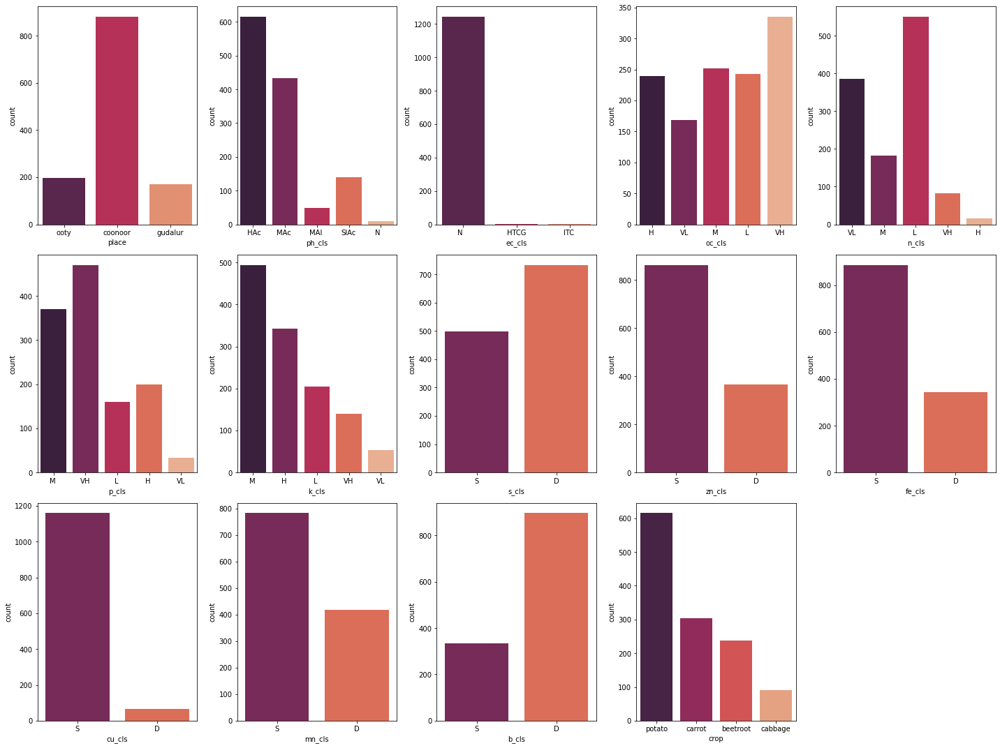

In [21]:
plt.figure(figsize=(20, 15))
plotnumber = 1

for column in categorical_features:
    if plotnumber <= 14:
        ax = plt.subplot(3, 5, plotnumber)
        sns.countplot(x=df_train[column], palette='rocket')
        plt.xlabel(column)

    plotnumber += 1

plt.tight_layout()
plt.show()

In [22]:
df_train['crop'].unique()

array(['potato', 'carrot', 'beetroot', 'cabbage'], dtype=object)

## 2. changing dependent categorical val to numerical values

In [23]:
df_train['crop'] = df_train['crop'].map({'potato':0, 'carrot':1, 'beetroot':2, 'cabbage':3})
df_train

,place,ph,ph_cls,ec,ec_cls,oc,oc_cls,n,n_cls,p,p_cls,k,k_cls,s,s_cls,zn,zn_cls,fe,fe_cls,cu,cu_cls,mn,mn_cls,b,b_cls,crop
690,ooty,5.05,HAc,0.710,N,0.810,H,NaN,NaN,32.000,M,155.000,M,37.500,S,1.600,S,34.180,S,NaN,NaN,7.260,S,1.000,S,0
728,ooty,4.90,HAc,0.180,N,0.210,VL,135.000,VL,128.000,VH,420.000,H,13.000,S,0.380,D,7.680,S,0.960,S,360.000,S,0.200,D,0
873,coonoor,6.40,MAc,0.260,N,0.840,H,111.000,VL,38.000,M,395.000,H,5.000,D,0.840,S,11.000,S,0.220,S,0.940,D,5.000,S,1
1491,coonoor,7.10,MAl,0.000,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2
620,gudalur,4.80,HAc,0.120,N,0.540,M,111.000,VL,20.000,L,290.000,M,23.000,S,2.760,S,21.760,S,0.940,S,11.280,S,1.200,S,0
402,coonoor,5.00,HAc,0.140,N,0.710,M,300.800,M,173.000,VH,228.000,M,7.500,D,0.220,D,6.040,S,0.460,S,0.840,D,0.200,D,0
438,coonoor,5.40,HAc,0.400,N,0.640,M,74.000,VL,81.000,H,155.000,M,40.000,S,1.760,S,44.130,S,0.740,S,11.420,S,2.000,S,0
399,coonoor,5.00,HAc,0.170,N,0.980,H,204.020,L,12.000,L,93.000,L,7.500,D,0.960,S,1.980,D,0.410,S,0.980,D,0.200,D,0
325,coonoor,5.00,HAc,0.520,N,0.500,L,46.200,VL,161.000,VH,1235.000,VH,12.500,S,3.560,S,4.740,S,0.840,S,1.080,D,0.200,D,0
1463,coonoor,6.50,MAc,0.270,N,1.470,VH,1579.000,VH,124.000,VH,309.000,M,7.500,D,1.770,S,0.700,D,0.200,D,0.320,D,0.200,D,2


Text(0.5, 1.0, 'Correlations between different predictors')

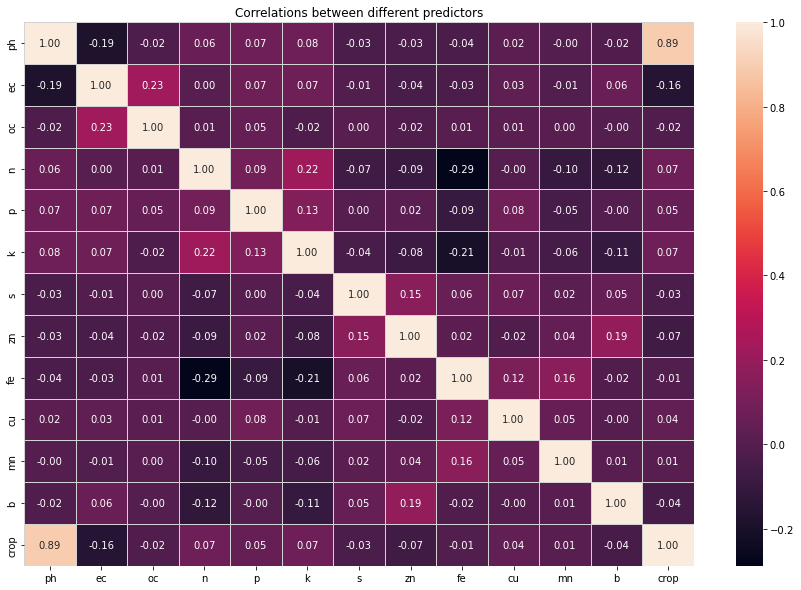

In [24]:
f, ax = plt.subplots(figsize=(15, 10))

sns.heatmap(df_train.corr(), annot=True, linecolor='lightgrey',
            fmt='.2f', ax=ax, linewidths=.5)
plt.title('Correlations between different predictors')

In [25]:
categorical_features = df_train.select_dtypes(include=['object'])
numerical_features = df_train.select_dtypes(exclude=['object'])

In [26]:
((numerical_features.isnull().mean())*100).sort_values(ascending=False)

mn      3.534137
n       2.329317
cu      1.686747
zn      1.285141
fe      1.285141
b       1.285141
s       1.044177
p       0.883534
k       0.883534
oc      0.642570
ph      0.000000
ec      0.000000
crop    0.000000
dtype: float64

## 3. checking and handling null values

In [27]:
df_train.isnull().sum()

place      0
ph         0
ph_cls     0
ec         0
ec_cls     0
oc         8
oc_cls     8
n         29
n_cls     29
p         11
p_cls     11
k         11
k_cls     11
s         13
s_cls     13
zn        16
zn_cls    16
fe        16
fe_cls    16
cu        21
cu_cls    21
mn        44
mn_cls    44
b         16
b_cls     16
crop       0
dtype: int64

In [28]:
df_train[df_train.isnull().any(axis=1)]

,place,ph,ph_cls,ec,ec_cls,oc,oc_cls,n,n_cls,p,p_cls,k,k_cls,s,s_cls,zn,zn_cls,fe,fe_cls,cu,cu_cls,mn,mn_cls,b,b_cls,crop
690,ooty,5.05,HAc,0.71,N,0.81,H,NaN,NaN,32.00,M,155.00,M,37.500,S,1.60,S,34.18,S,NaN,NaN,7.26,S,1.00,S,0
1491,coonoor,7.10,MAl,0.00,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2
1464,coonoor,6.60,SlAc,0.22,N,0.60,M,556.70,M,74.00,H,661.00,H,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2
602,gudalur,4.90,HAc,0.12,N,0.00,VL,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
389,coonoor,5.40,HAc,0.16,N,0.93,H,127.60,VL,37.00,M,247.00,M,12.500,S,1.17,S,6.14,S,0.46,S,NaN,NaN,0.20,D,0
180,coonoor,5.00,HAc,0.29,N,0.54,M,355.30,M,62.00,H,173.00,M,20.000,S,0.60,D,19.50,S,0.66,S,NaN,NaN,0.50,D,0
1720,ooty,6.60,SlAc,0.00,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2
259,coonoor,4.80,HAc,0.84,N,1.74,VH,200.50,L,445.00,VH,240.00,M,7.500,D,2.37,S,3.08,D,1.96,S,NaN,NaN,0.50,D,0
1563,coonoor,6.40,MAc,0.10,N,0.76,H,204.00,L,12.00,L,272.00,M,12.500,S,0.54,D,25.36,S,0.96,S,NaN,NaN,0.20,D,2
24,coonoor,5.10,HAc,0.37,N,0.90,H,57.40,VL,52.00,M,205.00,M,13.000,S,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0


## do this

In [29]:
df_train = df_train[df_train.isnull().sum(axis=1) < 3]
df_train

,place,ph,ph_cls,ec,ec_cls,oc,oc_cls,n,n_cls,p,p_cls,k,k_cls,s,s_cls,zn,zn_cls,fe,fe_cls,cu,cu_cls,mn,mn_cls,b,b_cls,crop
728,ooty,4.90,HAc,0.180,N,0.210,VL,135.000,VL,128.000,VH,420.000,H,13.000,S,0.380,D,7.680,S,0.960,S,360.000,S,0.200,D,0
873,coonoor,6.40,MAc,0.260,N,0.840,H,111.000,VL,38.000,M,395.000,H,5.000,D,0.840,S,11.000,S,0.220,S,0.940,D,5.000,S,1
620,gudalur,4.80,HAc,0.120,N,0.540,M,111.000,VL,20.000,L,290.000,M,23.000,S,2.760,S,21.760,S,0.940,S,11.280,S,1.200,S,0
402,coonoor,5.00,HAc,0.140,N,0.710,M,300.800,M,173.000,VH,228.000,M,7.500,D,0.220,D,6.040,S,0.460,S,0.840,D,0.200,D,0
438,coonoor,5.40,HAc,0.400,N,0.640,M,74.000,VL,81.000,H,155.000,M,40.000,S,1.760,S,44.130,S,0.740,S,11.420,S,2.000,S,0
399,coonoor,5.00,HAc,0.170,N,0.980,H,204.020,L,12.000,L,93.000,L,7.500,D,0.960,S,1.980,D,0.410,S,0.980,D,0.200,D,0
325,coonoor,5.00,HAc,0.520,N,0.500,L,46.200,VL,161.000,VH,1235.000,VH,12.500,S,3.560,S,4.740,S,0.840,S,1.080,D,0.200,D,0
1463,coonoor,6.50,MAc,0.270,N,1.470,VH,1579.000,VH,124.000,VH,309.000,M,7.500,D,1.770,S,0.700,D,0.200,D,0.320,D,0.200,D,2
138,coonoor,5.40,HAc,0.100,N,0.950,H,1362.700,VH,74.000,H,253.100,M,7.500,D,0.640,S,1.940,D,0.720,S,1.030,D,0.500,D,0
1001,coonoor,6.00,MAc,0.120,N,0.720,M,30.800,VL,168.000,VH,1235.000,VH,12.500,S,3.320,S,2.960,D,0.920,S,1.980,D,0.200,D,1


In [30]:
df_train = df_train.fillna(method='ffill')
df_train

,place,ph,ph_cls,ec,ec_cls,oc,oc_cls,n,n_cls,p,p_cls,k,k_cls,s,s_cls,zn,zn_cls,fe,fe_cls,cu,cu_cls,mn,mn_cls,b,b_cls,crop
728,ooty,4.90,HAc,0.180,N,0.210,VL,135.000,VL,128.000,VH,420.000,H,13.000,S,0.380,D,7.680,S,0.960,S,360.000,S,0.200,D,0
873,coonoor,6.40,MAc,0.260,N,0.840,H,111.000,VL,38.000,M,395.000,H,5.000,D,0.840,S,11.000,S,0.220,S,0.940,D,5.000,S,1
620,gudalur,4.80,HAc,0.120,N,0.540,M,111.000,VL,20.000,L,290.000,M,23.000,S,2.760,S,21.760,S,0.940,S,11.280,S,1.200,S,0
402,coonoor,5.00,HAc,0.140,N,0.710,M,300.800,M,173.000,VH,228.000,M,7.500,D,0.220,D,6.040,S,0.460,S,0.840,D,0.200,D,0
438,coonoor,5.40,HAc,0.400,N,0.640,M,74.000,VL,81.000,H,155.000,M,40.000,S,1.760,S,44.130,S,0.740,S,11.420,S,2.000,S,0
399,coonoor,5.00,HAc,0.170,N,0.980,H,204.020,L,12.000,L,93.000,L,7.500,D,0.960,S,1.980,D,0.410,S,0.980,D,0.200,D,0
325,coonoor,5.00,HAc,0.520,N,0.500,L,46.200,VL,161.000,VH,1235.000,VH,12.500,S,3.560,S,4.740,S,0.840,S,1.080,D,0.200,D,0
1463,coonoor,6.50,MAc,0.270,N,1.470,VH,1579.000,VH,124.000,VH,309.000,M,7.500,D,1.770,S,0.700,D,0.200,D,0.320,D,0.200,D,2
138,coonoor,5.40,HAc,0.100,N,0.950,H,1362.700,VH,74.000,H,253.100,M,7.500,D,0.640,S,1.940,D,0.720,S,1.030,D,0.500,D,0
1001,coonoor,6.00,MAc,0.120,N,0.720,M,30.800,VL,168.000,VH,1235.000,VH,12.500,S,3.320,S,2.960,D,0.920,S,1.980,D,0.200,D,1


In [31]:
df_train.isnull().sum()

place     0
ph        0
ph_cls    0
ec        0
ec_cls    0
oc        0
oc_cls    0
n         0
n_cls     0
p         0
p_cls     0
k         0
k_cls     0
s         0
s_cls     0
zn        0
zn_cls    0
fe        0
fe_cls    0
cu        0
cu_cls    0
mn        0
mn_cls    0
b         0
b_cls     0
crop      0
dtype: int64

In [32]:
df_train.describe()

,ph,ec,oc,n,p,k,s,zn,fe,cu,mn,b,crop
count,1228.00000,1228.000000,1228.000000,1228.000000,1228.000000,1228.000000,1228.000000,1228.000000,1228.000000,1228.000000,1228.000000,1228.000000,1228.000000
mean,5.78079,0.204564,0.829568,255.042752,98.354825,358.457830,12.611208,1.415396,17.837726,1.216748,7.757717,1.841573,0.841205
std,0.73431,0.226290,2.224460,263.736764,108.853863,282.465165,21.079231,3.102635,21.029958,1.571051,28.049724,5.284160,0.971491
min,4.80000,0.010000,0.020000,0.180000,0.241000,0.200000,0.150000,0.000000,0.000000,0.000000,0.000000,0.010000,0.000000
25%,5.10000,0.080000,0.440000,111.000000,25.000000,160.000000,7.500000,0.520000,4.260000,0.530000,1.260000,0.200000,0.000000
50%,6.00000,0.140000,0.720000,183.200000,62.000000,272.000000,7.500000,0.860000,10.950000,0.870000,3.180000,0.500000,1.000000
75%,6.40000,0.270000,1.050000,273.100000,128.440000,474.000000,13.000000,1.200000,21.760000,1.200000,6.917500,0.640000,2.000000
max,7.50000,4.600000,77.000000,2214.000000,1452.000000,2169.000000,394.000000,64.000000,324.000000,15.680000,510.000000,62.500000,3.000000


In [33]:
for col in categorical_features:
    print(f'{col} has {df_train[col].nunique()} categories\n')

place has 3 categories

ph_cls has 5 categories

ec_cls has 3 categories

oc_cls has 5 categories

n_cls has 5 categories

p_cls has 5 categories

k_cls has 5 categories

s_cls has 2 categories

zn_cls has 2 categories

fe_cls has 2 categories

cu_cls has 2 categories

mn_cls has 2 categories

b_cls has 2 categories



In [34]:
for col in df_train[categorical_features.columns]:
    print(f'{col} :{df_train[col].unique()} \n')

place :['ooty' 'coonoor' 'gudalur'] 

ph_cls :[' HAc' 'MAc ' 'MAl ' 'SlAc' 'N   '] 

ec_cls :['N   ' 'HTCG' 'ITC '] 

oc_cls :['VL' 'H ' 'M ' 'L ' 'VH'] 

n_cls :['VL' 'M ' 'L ' 'VH' 'H '] 

p_cls :['VH' 'M ' 'L ' 'H ' 'VL'] 

k_cls :['H ' 'M ' 'L ' 'VH' 'VL'] 

s_cls :['S' 'D'] 

zn_cls :['D' 'S'] 

fe_cls :['S' 'D'] 

cu_cls :['S' 'D'] 

mn_cls :['S' 'D'] 

b_cls :['D' 'S'] 



In [35]:
df_train.shape


(1228, 26)

## 4. splitting x and y

In [36]:
x_train = df_train.iloc[:,:-1]
y_train = df_train.iloc[:,-1]


In [37]:
x_train.shape

(1228, 25)

In [38]:
y_train.shape

(1228,)

In [39]:
x_train

,place,ph,ph_cls,ec,ec_cls,oc,oc_cls,n,n_cls,p,p_cls,k,k_cls,s,s_cls,zn,zn_cls,fe,fe_cls,cu,cu_cls,mn,mn_cls,b,b_cls
728,ooty,4.90,HAc,0.180,N,0.210,VL,135.000,VL,128.000,VH,420.000,H,13.000,S,0.380,D,7.680,S,0.960,S,360.000,S,0.200,D
873,coonoor,6.40,MAc,0.260,N,0.840,H,111.000,VL,38.000,M,395.000,H,5.000,D,0.840,S,11.000,S,0.220,S,0.940,D,5.000,S
620,gudalur,4.80,HAc,0.120,N,0.540,M,111.000,VL,20.000,L,290.000,M,23.000,S,2.760,S,21.760,S,0.940,S,11.280,S,1.200,S
402,coonoor,5.00,HAc,0.140,N,0.710,M,300.800,M,173.000,VH,228.000,M,7.500,D,0.220,D,6.040,S,0.460,S,0.840,D,0.200,D
438,coonoor,5.40,HAc,0.400,N,0.640,M,74.000,VL,81.000,H,155.000,M,40.000,S,1.760,S,44.130,S,0.740,S,11.420,S,2.000,S
399,coonoor,5.00,HAc,0.170,N,0.980,H,204.020,L,12.000,L,93.000,L,7.500,D,0.960,S,1.980,D,0.410,S,0.980,D,0.200,D
325,coonoor,5.00,HAc,0.520,N,0.500,L,46.200,VL,161.000,VH,1235.000,VH,12.500,S,3.560,S,4.740,S,0.840,S,1.080,D,0.200,D
1463,coonoor,6.50,MAc,0.270,N,1.470,VH,1579.000,VH,124.000,VH,309.000,M,7.500,D,1.770,S,0.700,D,0.200,D,0.320,D,0.200,D
138,coonoor,5.40,HAc,0.100,N,0.950,H,1362.700,VH,74.000,H,253.100,M,7.500,D,0.640,S,1.940,D,0.720,S,1.030,D,0.500,D
1001,coonoor,6.00,MAc,0.120,N,0.720,M,30.800,VL,168.000,VH,1235.000,VH,12.500,S,3.320,S,2.960,D,0.920,S,1.980,D,0.200,D


In [40]:
y_train

728     0
873     1
620     0
402     0
438     0
399     0
325     0
1463    2
138     0
1001    1
1089    1
825     0
844     1
843     1
496     0
1182    1
191     0
235     0
267     0
954     1
1213    1
461     0
231     0
1415    2
1319    3
874     1
1407    2
770     0
344     0
1486    2
216     0
482     0
1117    1
1573    2
1150    1
680     0
67      0
584     0
389     0
867     1
599     0
1069    1
1123    1
699     0
1049    1
77      0
991     1
149     0
1151    1
878     1
140     0
1026    1
294     0
1038    1
1237    1
983     1
1343    3
990     1
633     0
1569    2
942     1
407     0
1122    1
307     0
801     0
819     0
1690    2
933     1
1666    2
832     0
422     0
1252    1
1708    2
180     0
715     0
713     0
698     0
395     0
1658    2
827     0
855     1
174     0
1296    3
1462    2
187     0
708     0
1226    1
5       0
1512    2
1074    1
1606    2
401     0
1048    1
1397    2
1371    3
1295    3
667     0
481     0
971     1
259     0


## 6. one hot encoding

In [41]:
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import make_column_transformer

In [42]:
column_trans = make_column_transformer((OneHotEncoder(), ['place', 'ph_cls', 'ec_cls', 'oc_cls', 'n_cls', 'p_cls',
                                       'k_cls', 's_cls', 'zn_cls', 'fe_cls', 'cu_cls', 'mn_cls', 'b_cls']), remainder='passthrough')

In [43]:
x_train = np.array(column_trans.fit_transform(x_train))

In [44]:
x_train

array([[0.000e+00, 0.000e+00, 1.000e+00, ..., 9.600e-01, 3.600e+02,
        2.000e-01],
       [1.000e+00, 0.000e+00, 0.000e+00, ..., 2.200e-01, 9.400e-01,
        5.000e+00],
       [0.000e+00, 1.000e+00, 0.000e+00, ..., 9.400e-01, 1.128e+01,
        1.200e+00],
       ...,
       [1.000e+00, 0.000e+00, 0.000e+00, ..., 2.160e+00, 7.470e+00,
        1.600e+00],
       [1.000e+00, 0.000e+00, 0.000e+00, ..., 9.800e-01, 1.220e+00,
        2.000e-01],
       [0.000e+00, 1.000e+00, 0.000e+00, ..., 5.200e-01, 1.876e+01,
        2.000e-01]])

## standard scalar

In [45]:
scaler = StandardScaler()

x_train = scaler.fit_transform(x_train)

<AxesSubplot:xlabel='crop', ylabel='count'>

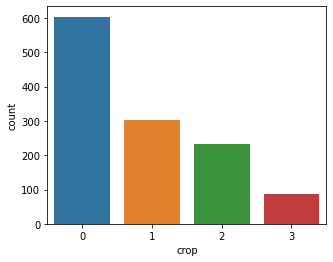

In [46]:
plt.figure(figsize=(5, 4))

sns.countplot(x=y_train)

In [47]:
y_train.value_counts()

0    604
1    303
2    233
3     88
Name: crop, dtype: int64

In [48]:
sm = SMOTE()

x_train, y_train = sm.fit_resample(x_train, y_train)

y_train.value_counts()

0    604
1    604
2    604
3    604
Name: crop, dtype: int64

## Applying all to test data 

In [49]:
df_test.shape

(415, 26)

In [50]:
df_test = df_test.rename(columns={'Place': 'place', 'pH': 'ph','pH (Cls) ':'ph_cls', 'EC':'ec', 'EC (Cls) ':'ec_cls', 'OC':'oc', 'OC (Cls) ':'oc_cls', 'N':'n',
       'N (Cls) ': 'n_cls', 'P':'p', 'P (Cls) ':'p_cls', 'K':'k', 'K( Cls) ':'k_cls', 'S':'s', 'S (Cls) ':'s_cls', 'Zn':'zn',
       'Zn (Cls) ':'zn_cls', 'Fe':'fe', 'Fe (Cls) ':'fe_cls', 'Cu':'cu', 'Cu( Cls) ':'cu_cls', 'Mn':'mn', 'Mn (Cls) ':'mn_cls',
       'B':'b', 'B( C ls) ':'b_cls', 'Suitable crop':'crop'})

In [51]:
df_test

,place,ph,ph_cls,ec,ec_cls,oc,oc_cls,n,n_cls,p,p_cls,k,k_cls,s,s_cls,zn,zn_cls,fe,fe_cls,cu,cu_cls,mn,mn_cls,b,b_cls,crop
459,coonoor,5.200,HAc,0.370,N,0.770,H,77.000,VL,44.000,M,205.00,M,5.00,D,0.980,S,52.200,S,0.260,S,4.180,S,0.200,D,potato
1346,coonoor,6.600,SlAc,0.090,N,0.900,H,1431.700,VH,62.000,H,407.50,H,7.50,D,0.280,D,3.100,D,12.800,S,0.940,D,0.200,D,cabbage
95,coonoor,4.900,HAc,0.220,N,0.150,VL,279.500,L,198.000,VH,179.00,M,87.50,S,0.480,D,18.320,S,0.680,S,3.150,S,0.560,S,potato
926,coonoor,6.100,MAc,0.110,N,0.550,M,1245.400,VH,12.000,L,518.70,H,7.50,D,0.790,S,2.160,D,0.640,S,0.950,D,0.200,D,carrot
33,coonoor,5.300,HAc,0.370,N,1.080,VH,61.600,VL,52.000,M,215.00,M,13.00,S,0.940,S,14.360,S,1.240,S,8.100,S,12.000,S,potato
707,ooty,5.400,HAc,0.200,N,1.200,VH,176.000,L,1.090,VL,3.83,VL,4.00,D,0.640,S,3.960,D,2.230,S,3.960,S,0.200,D,potato
539,gudalur,4.900,HAc,0.120,N,0.480,L,239.000,L,108.680,VH,506.00,H,13.00,S,3.420,S,32.060,S,1.320,S,19.630,S,1.600,S,potato
1422,coonoor,6.800,SlAc,0.050,N,1.220,VH,245.000,L,78.000,H,245.00,M,5.00,D,1.200,S,12.000,S,1.360,S,5.660,S,0.200,D,beetroot
240,coonoor,5.300,HAc,0.210,N,1.030,VH,366.500,M,62.000,H,364.00,H,7.50,D,0.220,D,6.500,S,1.300,S,4.200,S,0.200,D,potato
362,coonoor,4.900,HAc,0.310,N,0.540,M,231.600,L,37.000,M,123.50,L,12.50,S,0.940,S,6.100,S,1.080,S,4.220,S,12.500,S,potato


In [52]:
df_test['crop'] = df_test['crop'].map({'potato':0, 'carrot':1, 'beetroot':2, 'cabbage':3})
df_test

,place,ph,ph_cls,ec,ec_cls,oc,oc_cls,n,n_cls,p,p_cls,k,k_cls,s,s_cls,zn,zn_cls,fe,fe_cls,cu,cu_cls,mn,mn_cls,b,b_cls,crop
459,coonoor,5.200,HAc,0.370,N,0.770,H,77.000,VL,44.000,M,205.00,M,5.00,D,0.980,S,52.200,S,0.260,S,4.180,S,0.200,D,0
1346,coonoor,6.600,SlAc,0.090,N,0.900,H,1431.700,VH,62.000,H,407.50,H,7.50,D,0.280,D,3.100,D,12.800,S,0.940,D,0.200,D,3
95,coonoor,4.900,HAc,0.220,N,0.150,VL,279.500,L,198.000,VH,179.00,M,87.50,S,0.480,D,18.320,S,0.680,S,3.150,S,0.560,S,0
926,coonoor,6.100,MAc,0.110,N,0.550,M,1245.400,VH,12.000,L,518.70,H,7.50,D,0.790,S,2.160,D,0.640,S,0.950,D,0.200,D,1
33,coonoor,5.300,HAc,0.370,N,1.080,VH,61.600,VL,52.000,M,215.00,M,13.00,S,0.940,S,14.360,S,1.240,S,8.100,S,12.000,S,0
707,ooty,5.400,HAc,0.200,N,1.200,VH,176.000,L,1.090,VL,3.83,VL,4.00,D,0.640,S,3.960,D,2.230,S,3.960,S,0.200,D,0
539,gudalur,4.900,HAc,0.120,N,0.480,L,239.000,L,108.680,VH,506.00,H,13.00,S,3.420,S,32.060,S,1.320,S,19.630,S,1.600,S,0
1422,coonoor,6.800,SlAc,0.050,N,1.220,VH,245.000,L,78.000,H,245.00,M,5.00,D,1.200,S,12.000,S,1.360,S,5.660,S,0.200,D,2
240,coonoor,5.300,HAc,0.210,N,1.030,VH,366.500,M,62.000,H,364.00,H,7.50,D,0.220,D,6.500,S,1.300,S,4.200,S,0.200,D,0
362,coonoor,4.900,HAc,0.310,N,0.540,M,231.600,L,37.000,M,123.50,L,12.50,S,0.940,S,6.100,S,1.080,S,4.220,S,12.500,S,0


In [53]:
df_test= df_test[df_test.isnull().sum(axis=1) < 3]
df_test

,place,ph,ph_cls,ec,ec_cls,oc,oc_cls,n,n_cls,p,p_cls,k,k_cls,s,s_cls,zn,zn_cls,fe,fe_cls,cu,cu_cls,mn,mn_cls,b,b_cls,crop
459,coonoor,5.20,HAc,0.370,N,0.770,H,77.000,VL,44.000,M,205.00,M,5.00,D,0.980,S,52.200,S,0.260,S,4.180,S,0.200,D,0
1346,coonoor,6.60,SlAc,0.090,N,0.900,H,1431.700,VH,62.000,H,407.50,H,7.50,D,0.280,D,3.100,D,12.800,S,0.940,D,0.200,D,3
95,coonoor,4.90,HAc,0.220,N,0.150,VL,279.500,L,198.000,VH,179.00,M,87.50,S,0.480,D,18.320,S,0.680,S,3.150,S,0.560,S,0
926,coonoor,6.10,MAc,0.110,N,0.550,M,1245.400,VH,12.000,L,518.70,H,7.50,D,0.790,S,2.160,D,0.640,S,0.950,D,0.200,D,1
33,coonoor,5.30,HAc,0.370,N,1.080,VH,61.600,VL,52.000,M,215.00,M,13.00,S,0.940,S,14.360,S,1.240,S,8.100,S,12.000,S,0
707,ooty,5.40,HAc,0.200,N,1.200,VH,176.000,L,1.090,VL,3.83,VL,4.00,D,0.640,S,3.960,D,2.230,S,3.960,S,0.200,D,0
539,gudalur,4.90,HAc,0.120,N,0.480,L,239.000,L,108.680,VH,506.00,H,13.00,S,3.420,S,32.060,S,1.320,S,19.630,S,1.600,S,0
1422,coonoor,6.80,SlAc,0.050,N,1.220,VH,245.000,L,78.000,H,245.00,M,5.00,D,1.200,S,12.000,S,1.360,S,5.660,S,0.200,D,2
240,coonoor,5.30,HAc,0.210,N,1.030,VH,366.500,M,62.000,H,364.00,H,7.50,D,0.220,D,6.500,S,1.300,S,4.200,S,0.200,D,0
362,coonoor,4.90,HAc,0.310,N,0.540,M,231.600,L,37.000,M,123.50,L,12.50,S,0.940,S,6.100,S,1.080,S,4.220,S,12.500,S,0


In [54]:
df_test = df_test.fillna(method='ffill')
df_test.isnull().sum()

place     0
ph        0
ph_cls    0
ec        0
ec_cls    0
oc        0
oc_cls    0
n         0
n_cls     0
p         0
p_cls     0
k         0
k_cls     0
s         0
s_cls     0
zn        0
zn_cls    0
fe        0
fe_cls    0
cu        0
cu_cls    0
mn        0
mn_cls    0
b         0
b_cls     0
crop      0
dtype: int64

In [65]:
x_test = df_test.iloc[:,:55].values
y_test = df_test.iloc[:,-1]

In [66]:
x_test.shape

(409, 26)

In [67]:
y_test.shape

(409,)

In [68]:
column_trans_test = make_column_transformer((OneHotEncoder(), ['place', 'ph_cls', 'ec_cls', 'oc_cls', 'n_cls', 'p_cls',
                                       'k_cls', 's_cls', 'zn_cls', 'fe_cls', 'cu_cls', 'mn_cls', 'b_cls']), remainder='passthrough')

In [69]:
x_test = np.array(column_trans.fit_transform(x_test))

ValueError: Specifying the columns using strings is only supported for pandas DataFrames

In [70]:
x_test = scaler.fit_transform(x_test)

ValueError: could not convert string to float: 'coonoor'

<AxesSubplot:xlabel='crop', ylabel='count'>

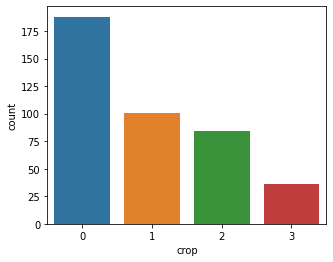

In [71]:
plt.figure(figsize=(5, 4))

sns.countplot(x=y_test)

In [72]:
x_test, y_test = sm.fit_resample(x_test, y_test)

y_test.value_counts()

ValueError: could not convert string to float: 'coonoor'

## Model Building

## Logistic reg

In [63]:
parameters = {'C': [1, 2, 3, 4, 5, 10]}

Logistic_Regression = GridSearchCV(
    LogisticRegression(), param_grid=parameters, cv=5, n_jobs=-1)
Logistic_Regression.fit(x_train, y_train)

print(f'The best parameters are {Logistic_Regression .best_params_}\n')
print(f'The best score is {Logistic_Regression .best_score_}')

The best parameters are {'C': 3}

The best score is 0.8100328525229712


C:\Users\rajal\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [64]:
clf = Logistic_Regression.best_estimator_

Logistic_Regression_train_accuracy = accuracy_score(
    y_train, clf.predict(x_train))
Logistic_Regression_test_accuracy = accuracy_score(y_test, clf.predict(x_test))


print(
    f'Training Accuracy of Logistic_Regression is {Logistic_Regression_train_accuracy}\n')
print(
    f'Test Accuracy of Logistic_Regression is {Logistic_Regression_test_accuracy } \n')

print(
    f'Confusion Matrix :- \n{confusion_matrix(y_test, clf.predict(x_test))}\n')
print(
    f'Classification Report :- \n {classification_report(y_test, clf.predict(x_test))}')

ValueError: X has 53 features, but LogisticRegression is expecting 55 features as input.

### DecisionTreeClassifier

In [ ]:
parameters = {'criterion': ['gini', 'entropy'],
              'max_depth': [2, 3, 4, 5, 6],
              'splitter': ['best', 'random'],
              'min_samples_split': [2, 3, 4],
              'min_samples_leaf': [1, 2, 3, 5, 7], }

Decision_tree_clf = GridSearchCV(
    DecisionTreeClassifier(), param_grid=parameters, cv=5, n_jobs=-1)
Decision_tree_clf.fit(x_train, y_train)

print(f'The best parameters are {Decision_tree_clf .best_params_}\n')
print(f'The best score is {Decision_tree_clf .best_score_}')

In [ ]:
clf = Decision_tree_clf.best_estimator_

Decision_tree_clf_train_accuracy = accuracy_score(
    y_train, clf.predict(x_train))
Decision_tree_clf_test_accuracy = accuracy_score(y_test, clf.predict(x_test))

print(
    f'Training Accuracy of Decision_tree_clf is {Decision_tree_clf_train_accuracy}\n')
print(
    f'Test Accuracy of Decision_tree_clf is {Decision_tree_clf_test_accuracy} \n')

print(
    f'Confusion Matrix :- \n{confusion_matrix(y_test, clf.predict(x_test))}\n')
print(
    f'Classification Report :- \n {classification_report(y_test, clf.predict(x_test))}')

### KNN

In [ ]:
n = list(range(1, 30))

parameters = {'n_neighbors': n}

knn_clf = GridSearchCV(KNeighborsClassifier(),
                       param_grid=parameters, cv=5, n_jobs=-1)
knn_clf.fit(x_train, y_train)

print(f'The best parameters are {knn_clf .best_params_}\n')
print(f'The best score is {knn_clf .best_score_}')

In [ ]:
clf = knn_clf.best_estimator_

knn_clf_train_accuracy = accuracy_score(y_train, clf.predict(x_train))
knn_clf_test_accuracy = accuracy_score(y_test, clf.predict(x_test))

print(f'Training Accuracy of knn_clf is {knn_clf_train_accuracy}\n')
print(f'Test Accuracy of knn_clf is {knn_clf_test_accuracy} \n')

print(
    f'Confusion Matrix :- \n{confusion_matrix(y_test, clf.predict(x_test))}\n')
print(
    f'Classification Report :- \n {classification_report(y_test, clf.predict(x_test))}')

### Random Forest

In [ ]:
parameters = {'n_estimators': [10, 17, 25, 33, 41, 48],
              'criterion': ['gini', 'entropy'],
              'max_depth': [2, 3, 4, 5, 6],
              'min_samples_split': [2, 3, 4]}

Random_forest_clf = GridSearchCV(
    RandomForestClassifier(), param_grid=parameters, cv=5, n_jobs=-1)
Random_forest_clf.fit(x_train, y_train)

print(f'The best parameters are {Random_forest_clf .best_params_}\n')
print(f'The best score is {Random_forest_clf .best_score_}')

In [ ]:
clf = Random_forest_clf.best_estimator_

Random_forest_clf_train_accuracy = accuracy_score(
    y_train, clf.predict(x_train))
Random_forest_clf_test_accuracy = accuracy_score(y_test, clf.predict(x_test))

print(
    f'Training Accuracy of Random_forest_clf is {Random_forest_clf_train_accuracy}\n')
print(
    f'Test Accuracy of Random_forest_clf is {Random_forest_clf_test_accuracy} \n')

print(
    f'Confusion Matrix :- \n{confusion_matrix(y_test, clf.predict(x_test))}\n')
print(
    f'Classification Report :- \n {classification_report(y_test, clf.predict(x_test))}')

### Xgboost

In [ ]:
parameters = {'learning_rate': [0.05, 0.10, 0.15, 0.20, 0.25],
              'max_depth': [2, 3, 4, 5, 6, 8, 9],
              'min_child_weight': [1, 3, 4, 5, 7],
              'gamma': [0.3, 0.4, 0.5, 0.7]}

xgboost_clf = GridSearchCV(
    XGBClassifier(), param_grid=parameters, cv=5, n_jobs=-1)
xgboost_clf.fit(x_train, y_train)

print(f'The best parameters are {xgboost_clf .best_params_}\n')
print(f'The best score is {xgboost_clf .best_score_}')

In [ ]:
clf = xgboost_clf.best_estimator_

xgboost_clf_train_accuracy = accuracy_score(y_train, clf.predict(x_train))
xgboost_clf_test_accuracy = accuracy_score(y_test, clf.predict(x_test))

print(f'Training Accuracy of xgboost_clf is {xgboost_clf_train_accuracy}\n')
print(f'Test Accuracy of xgboost_clf is {xgboost_clf_test_accuracy} \n')

print(
    f'Confusion Matrix :- \n{confusion_matrix(y_test, clf.predict(x_test))}\n')
print(
    f'Classification Report :- \n {classification_report(y_test, clf.predict(x_test))}')

## Model_comparision

In [ ]:
models = pd.DataFrame({
    'Model': ['Logistic Regression', 'KNN', 'Decision Tree Classifier', 'Random Forest Classifier', 'XgBoost'],
    'Train_Score': [Logistic_Regression_train_accuracy, knn_clf_train_accuracy, Decision_tree_clf_train_accuracy, Random_forest_clf_train_accuracy, xgboost_clf_train_accuracy],
    'Test_Score': [Logistic_Regression_test_accuracy, knn_clf_test_accuracy, Decision_tree_clf_test_accuracy, Random_forest_clf_test_accuracy, xgboost_clf_test_accuracy]
})


model_compare = models.sort_values(by='Test_Score', ascending=False)
model_compare